In [5]:
!pip install ultralytics -qq

# Object Detecion
import cv2
from ultralytics import YOLO
#plots
import matplotlib.pyplot as plt
import seaborn as sns

#basics
import pandas as pd
import numpy as np
import os
import subprocess

from tqdm.notebook import tqdm

# Display image and videos
import IPython
from IPython.display import Video, display
%matplotlib inline


import urllib.request
import shutil

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 51.1 MB/s eta 0:00:00


In [6]:

!pip install -U -q PyDrive

from pydrive.auth import GoogleAuth

from pydrive.drive import GoogleDrive

from google.colab import auth

from oauth2client.client import GoogleCredentials

auth.authenticate_user()

gauth = GoogleAuth()

gauth.credentials = GoogleCredentials.get_application_default()

drive = GoogleDrive(gauth)

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
path = "/content/drive/MyDrive/WEEK 14/vid1.mp4"

In [8]:
model = YOLO('yolov8x.pt')

dict_classes = model.model.names

100%|██████████| 131M/131M [00:00<00:00, 216MB/s]


In [11]:
def risize_frame(frame, scale_percent):
  width = int(frame.shape[1] * scale_percent / 100)
  height = int(frame.shape[0] * scale_percent / 100)

  dim = (width, height)

  resized = cv2.resize(frame, dim, interpolation= cv2.INTER_AREA)

  return resized

def filter_tracks(centers, patience):
  filter_dict = {}
  for k, i in centers.items():
    d_frames = i.items()
    filter_dict[k] = dict(list(d_frames)[-patience:])
  return filter_dict

def update_tracking(centers_old,obj_center, thr_centers, lastKey, frame, frame_max):
    is_new = 0
    lastpos = [(k, list(center.keys())[-1], list(center.values())[-1]) for k, center in centers_old.items()]
    lastpos = [(i[0], i[2]) for i in lastpos if abs(i[1] - frame) <= frame_max]
    previous_pos = [(k,obj_center) for k,centers in lastpos if (np.linalg.norm(np.array(centers) - np.array(obj_center)) < thr_centers)]
    if previous_pos:
        id_obj = previous_pos[0][0]
        centers_old[id_obj][frame] = obj_center

    else:
        if lastKey:
            last = lastKey.split('D')[1]
            id_obj = 'ID' + str(int(last)+1)
        else:
            id_obj = 'ID0'

        is_new = 1
        centers_old[id_obj] = {frame:obj_center}
        lastKey = list(centers_old.keys())[-1]


    return centers_old, id_obj, is_new, lastKey

In [17]:
import cv2
import numpy as np
import os
import pandas as pd
import subprocess
from tqdm import tqdm
import torch

# Configurations
verbose = False
scale_percent = 100
conf_level = 0.8
thr_centers = 20
frame_max = 5
patience = 100
alpha = 0.1

# Reading video with cv2
video_path = '/content/drive/MyDrive/WEEK 14/vid1.mp4'  # Video yolunu belirtin
video = cv2.VideoCapture(video_path)

# Objects to detect Yolo
class_IDS = [0]
centers_old = {}
obj_id = 0
end = []
frames_list = []
count_p = 0
lastKey = ''
print(f'[INFO] - Verbose during Prediction: {verbose}')

# Original informations of video
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
fps = video.get(cv2.CAP_PROP_FPS)
print('[INFO] - Original Dim: ', (width, height))

# Scaling Video for better performance
if scale_percent != 100:
    print('[INFO] - Scaling change may cause errors in pixels lines ')
    width = int(width * scale_percent / 100)
    height = int(height * scale_percent / 100)
    print('[INFO] - Dim Scaled: ', (width, height))

# Video output
video_name = 'result.mp4'
output_path = "rep_" + video_name
tmp_output_path = "tmp_" + output_path
VIDEO_CODEC = "MP4V"

output_video = cv2.VideoWriter(tmp_output_path,
                               cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                               fps, (width, height))

# Model yükleme ve cihaz seçimi
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(f"Kullanılan cihaz: {device}")

# Modeli MPS cihazına taşıyın
model = YOLO('yolov8x.pt')

dict_classes = model.model.names  # Modelinizi yükleyin ve adını değiştirin
model.to(device)

# Executing Recognition
for i in tqdm(range(int(video.get(cv2.CAP_PROP_FRAME_COUNT)))):
    # Reading frame from video
    ret, frame = video.read()
    if not ret:
        break

    # Applying resizing of read frame
    if scale_percent != 100:
        frame = cv2.resize(frame, (width, height))

    area_roi = [np.array([(1250, 400), (750, 400), (700, 800), (1200, 800)], np.int32)]
    ROI = frame[390:800, 700:1300]

    if verbose:
        print('Dimension Scaled(frame): ', (frame.shape[1], frame.shape[0]))

    # Getting predictions
    # Yeniden boyutlandırmayı modelin beklediği şekilde yapın (32'nin katı olan bir boyuta)
    new_height = (ROI.shape[0] // 32) * 32
    new_width = (ROI.shape[1] // 32) * 32
    ROI_resized = cv2.resize(ROI, (new_width, new_height))

    ROI_tensor = torch.tensor(ROI_resized).permute(2, 0, 1).unsqueeze(0).float().to(device)
    y_hat = model.predict(ROI_tensor, conf=conf_level, classes=class_IDS, verbose=False)

    # Getting the bounding boxes, confidence and classes of the recognized objects in the current frame.
    boxes = y_hat[0].boxes.xyxy.cpu().numpy()
    conf = y_hat[0].boxes.conf.cpu().numpy()
    classes = y_hat[0].boxes.cls.cpu().numpy()

    # Veriyi dataframe'e dönüştürme
    positions_frame = pd.DataFrame({
        'xmin': boxes[:, 0],
        'ymin': boxes[:, 1],
        'xmax': boxes[:, 2],
        'ymax': boxes[:, 3],
        'conf': conf,
        'class': classes
    })

    # Translating the numeric class labels to text
    labels = [dict_classes[i] for i in classes]

    # For each detected object, draw the bounding-box and count each one passing through the ROI area
    for ix, row in positions_frame.iterrows():
        xmin, ymin, xmax, ymax, confidence, category = row.astype('int')

        # Calculating the center of the bounding-box
        center_x, center_y = int((xmax + xmin) / 2), int((ymax + ymin) / 2)

        # Updating the tracking for each object
        centers_old, id_obj, is_new, lastKey = update_tracking(centers_old, (center_x, center_y), thr_centers, lastKey, i, frame_max)

        # Updating people in roi
        count_p += is_new

        # Drawing center and bounding-box in the given frame
        cv2.rectangle(ROI_resized, (xmin, ymin), (xmax, ymax), (0, 0, 255), 2)  # box
        for cx, cy in centers_old[id_obj].values():
            cv2.circle(ROI_resized, (cx, cy), 5, (0, 0, 255), -1)  # center of box

        # Drawing above the bounding-box the name of class recognized.
        cv2.putText(img=ROI_resized, text=f'{id_obj}:{np.round(conf[ix], 2)}',
                    org=(xmin, ymin-10), fontFace=cv2.FONT_HERSHEY_TRIPLEX,
                    fontScale=0.8, color=(0, 0, 255), thickness=1)

    # Drawing the number of people
    cv2.putText(img=frame, text=f'Counts People in ROI: {count_p}',
                org=(30, 40), fontFace=cv2.FONT_HERSHEY_TRIPLEX,
                fontScale=1.5, color=(255, 0, 0), thickness=1)

    # Filtering tracks history
    centers_old = filter_tracks(centers_old, patience)
    if verbose:
        print(contador_in, contador_out)

    # Drawing the ROI area
    overlay = frame.copy()
    cv2.polylines(overlay, pts=area_roi, isClosed=True, color=(255, 0, 0), thickness=2)
    cv2.fillPoly(overlay, area_roi, (255, 0, 0))
    frame = cv2.addWeighted(overlay, alpha, frame, 1 - alpha, 0)

    # Saving frames in a list
    frames_list.append(frame)
    # Saving transformed frames in an output video format
    output_video.write(frame)

# Releasing the video
output_video.release()

# Post processing
if os.path.exists(output_path):
    os.remove(output_path)

subprocess.run(
    ["ffmpeg", "-i", tmp_output_path, "-crf", "18", "-preset", "veryfast", "-hide_banner", "-loglevel", "error", "-vcodec", "libx264", output_path]
)
os.remove(tmp_output_path)

[INFO] - Verbose during Prediction: False
[INFO] - Original Dim:  (1920, 1080)
Kullanılan cihaz: cpu


  0%|          | 0/341 [00:00<?, ?it/s]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


  0%|          | 1/341 [00:05<29:02,  5.12s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


  1%|          | 2/341 [00:06<16:50,  2.98s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


  1%|          | 3/341 [00:08<13:04,  2.32s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


  1%|          | 4/341 [00:09<11:07,  1.98s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


  1%|▏         | 5/341 [00:11<10:08,  1.81s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


  2%|▏         | 6/341 [00:12<09:51,  1.77s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


  2%|▏         | 7/341 [00:15<10:53,  1.96s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


  2%|▏         | 8/341 [00:17<11:23,  2.05s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


  3%|▎         | 9/341 [00:19<10:44,  1.94s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


  3%|▎         | 10/341 [00:20<10:04,  1.83s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


  3%|▎         | 11/341 [00:22<09:24,  1.71s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 253.0. Dividing input by 255.


  4%|▎         | 12/341 [00:23<09:00,  1.64s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 253.0. Dividing input by 255.


  4%|▍         | 13/341 [00:25<08:39,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


  4%|▍         | 14/341 [00:26<08:28,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 254.0. Dividing input by 255.


  4%|▍         | 15/341 [00:28<08:39,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


  5%|▍         | 16/341 [00:30<09:34,  1.77s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


  5%|▍         | 17/341 [00:32<10:27,  1.94s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


  5%|▌         | 18/341 [00:34<09:47,  1.82s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


  6%|▌         | 19/341 [00:35<09:10,  1.71s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


  6%|▌         | 20/341 [00:37<08:55,  1.67s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


  6%|▌         | 21/341 [00:38<08:36,  1.61s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


  6%|▋         | 22/341 [00:40<08:23,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


  7%|▋         | 23/341 [00:41<08:10,  1.54s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


  7%|▋         | 24/341 [00:43<08:25,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


  7%|▋         | 25/341 [00:45<09:28,  1.80s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


  8%|▊         | 26/341 [00:48<10:18,  1.96s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 240.0. Dividing input by 255.


  8%|▊         | 27/341 [00:49<09:34,  1.83s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 239.0. Dividing input by 255.


  8%|▊         | 28/341 [00:51<08:57,  1.72s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 234.0. Dividing input by 255.


  9%|▊         | 29/341 [00:52<08:28,  1.63s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 236.0. Dividing input by 255.


  9%|▉         | 30/341 [00:53<08:13,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 238.0. Dividing input by 255.


  9%|▉         | 31/341 [00:55<07:57,  1.54s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 239.0. Dividing input by 255.


  9%|▉         | 32/341 [00:56<07:45,  1.51s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 239.0. Dividing input by 255.


 10%|▉         | 33/341 [00:58<07:51,  1.53s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 10%|▉         | 34/341 [01:00<08:54,  1.74s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 10%|█         | 35/341 [01:02<09:37,  1.89s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 11%|█         | 36/341 [01:04<09:15,  1.82s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 11%|█         | 37/341 [01:05<08:40,  1.71s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 236.0. Dividing input by 255.


 11%|█         | 38/341 [01:07<08:18,  1.64s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 236.0. Dividing input by 255.


 11%|█▏        | 39/341 [01:08<07:54,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 239.0. Dividing input by 255.


 12%|█▏        | 40/341 [01:10<07:39,  1.53s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 239.0. Dividing input by 255.


 12%|█▏        | 41/341 [01:11<07:32,  1.51s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 237.0. Dividing input by 255.


 12%|█▏        | 42/341 [01:13<07:25,  1.49s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 239.0. Dividing input by 255.


 13%|█▎        | 43/341 [01:15<08:30,  1.71s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 238.0. Dividing input by 255.


 13%|█▎        | 44/341 [01:17<09:15,  1.87s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 13%|█▎        | 45/341 [01:19<09:05,  1.84s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 13%|█▎        | 46/341 [01:20<08:33,  1.74s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 14%|█▍        | 47/341 [01:22<08:05,  1.65s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 14%|█▍        | 48/341 [01:23<07:46,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 14%|█▍        | 49/341 [01:25<07:32,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 15%|█▍        | 50/341 [01:27<09:03,  1.87s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 15%|█▍        | 51/341 [01:29<09:01,  1.87s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 15%|█▌        | 52/341 [01:32<09:30,  1.97s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 16%|█▌        | 53/341 [01:34<09:38,  2.01s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 16%|█▌        | 54/341 [01:35<08:52,  1.86s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 16%|█▌        | 55/341 [01:37<08:17,  1.74s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 16%|█▋        | 56/341 [01:38<08:00,  1.69s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 17%|█▋        | 57/341 [01:40<07:44,  1.64s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 17%|█▋        | 58/341 [01:41<07:27,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 17%|█▋        | 59/341 [01:43<07:22,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 18%|█▊        | 60/341 [01:45<07:48,  1.67s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 18%|█▊        | 61/341 [01:47<08:31,  1.83s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 18%|█▊        | 62/341 [01:49<08:45,  1.88s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 18%|█▊        | 63/341 [01:50<08:09,  1.76s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 19%|█▉        | 64/341 [01:52<07:47,  1.69s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 19%|█▉        | 65/341 [01:53<07:27,  1.62s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 19%|█▉        | 66/341 [01:55<07:11,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 251.0. Dividing input by 255.


 20%|█▉        | 67/341 [01:56<07:01,  1.54s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 20%|█▉        | 68/341 [01:58<06:53,  1.51s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 238.0. Dividing input by 255.


 20%|██        | 69/341 [01:59<07:11,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 21%|██        | 70/341 [02:01<07:57,  1.76s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 21%|██        | 71/341 [02:04<08:22,  1.86s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 236.0. Dividing input by 255.


 21%|██        | 72/341 [02:05<07:51,  1.75s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 236.0. Dividing input by 255.


 21%|██▏       | 73/341 [02:07<07:25,  1.66s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 240.0. Dividing input by 255.


 22%|██▏       | 74/341 [02:08<07:05,  1.60s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 22%|██▏       | 75/341 [02:09<06:51,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 22%|██▏       | 76/341 [02:11<06:41,  1.51s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 251.0. Dividing input by 255.


 23%|██▎       | 77/341 [02:12<06:35,  1.50s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 23%|██▎       | 78/341 [02:14<06:50,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 23%|██▎       | 79/341 [02:16<07:50,  1.80s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 23%|██▎       | 80/341 [02:19<08:22,  1.93s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 24%|██▍       | 81/341 [02:20<07:48,  1.80s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 24%|██▍       | 82/341 [02:22<07:18,  1.69s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 24%|██▍       | 83/341 [02:23<06:57,  1.62s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 251.0. Dividing input by 255.


 25%|██▍       | 84/341 [02:24<06:39,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 25%|██▍       | 85/341 [02:26<06:31,  1.53s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 25%|██▌       | 86/341 [02:27<06:26,  1.52s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 26%|██▌       | 87/341 [02:29<06:38,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 237.0. Dividing input by 255.


 26%|██▌       | 88/341 [02:31<07:28,  1.77s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 240.0. Dividing input by 255.


 26%|██▌       | 89/341 [02:34<08:01,  1.91s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 26%|██▋       | 90/341 [02:35<07:24,  1.77s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 27%|██▋       | 91/341 [02:36<07:03,  1.70s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 27%|██▋       | 92/341 [02:38<06:45,  1.63s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 240.0. Dividing input by 255.


 27%|██▋       | 93/341 [02:39<06:35,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 28%|██▊       | 94/341 [02:41<06:25,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 239.0. Dividing input by 255.


 28%|██▊       | 95/341 [02:42<06:15,  1.52s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 238.0. Dividing input by 255.


 28%|██▊       | 96/341 [02:44<06:15,  1.53s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 240.0. Dividing input by 255.


 28%|██▊       | 97/341 [02:46<07:08,  1.76s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 29%|██▊       | 98/341 [02:48<07:41,  1.90s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 238.0. Dividing input by 255.


 29%|██▉       | 99/341 [02:50<07:21,  1.82s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 29%|██▉       | 100/341 [02:52<06:54,  1.72s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 30%|██▉       | 101/341 [02:53<06:36,  1.65s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 30%|██▉       | 102/341 [02:55<06:22,  1.60s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 30%|███       | 103/341 [02:56<06:12,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 30%|███       | 104/341 [02:58<06:08,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 31%|███       | 105/341 [02:59<06:14,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 31%|███       | 106/341 [03:02<07:03,  1.80s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 31%|███▏      | 107/341 [03:04<07:39,  1.96s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 32%|███▏      | 108/341 [03:06<07:14,  1.87s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 32%|███▏      | 109/341 [03:07<06:47,  1.76s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 32%|███▏      | 110/341 [03:09<06:32,  1.70s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 33%|███▎      | 111/341 [03:10<06:15,  1.63s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 33%|███▎      | 112/341 [03:12<06:04,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 33%|███▎      | 113/341 [03:13<05:57,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 33%|███▎      | 114/341 [03:15<06:03,  1.60s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 34%|███▎      | 115/341 [03:17<06:48,  1.81s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 34%|███▍      | 116/341 [03:19<07:16,  1.94s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 34%|███▍      | 117/341 [03:21<06:50,  1.83s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 35%|███▍      | 118/341 [03:22<06:26,  1.73s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 35%|███▍      | 119/341 [03:24<06:08,  1.66s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 35%|███▌      | 120/341 [03:25<05:57,  1.62s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 35%|███▌      | 121/341 [03:27<05:47,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 36%|███▌      | 122/341 [03:28<05:38,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 254.0. Dividing input by 255.


 36%|███▌      | 123/341 [03:30<05:40,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 36%|███▋      | 124/341 [03:32<06:18,  1.75s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 37%|███▋      | 125/341 [03:34<06:44,  1.87s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 37%|███▋      | 126/341 [03:36<06:23,  1.78s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 37%|███▋      | 127/341 [03:37<06:04,  1.70s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 38%|███▊      | 128/341 [03:39<05:54,  1.66s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 38%|███▊      | 129/341 [03:40<05:43,  1.62s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 38%|███▊      | 130/341 [03:42<05:37,  1.60s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 38%|███▊      | 131/341 [03:44<05:29,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 39%|███▊      | 132/341 [03:45<05:29,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 39%|███▉      | 133/341 [03:47<06:12,  1.79s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 39%|███▉      | 134/341 [03:50<06:35,  1.91s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 40%|███▉      | 135/341 [03:51<06:15,  1.82s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 40%|███▉      | 136/341 [03:53<05:53,  1.73s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 40%|████      | 137/341 [03:54<05:36,  1.65s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 40%|████      | 138/341 [03:56<05:25,  1.60s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 41%|████      | 139/341 [03:57<05:15,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 254.0. Dividing input by 255.


 41%|████      | 140/341 [03:59<05:10,  1.54s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 253.0. Dividing input by 255.


 41%|████▏     | 141/341 [04:00<05:10,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 42%|████▏     | 142/341 [04:03<05:52,  1.77s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 42%|████▏     | 143/341 [04:05<06:18,  1.91s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 42%|████▏     | 144/341 [04:06<06:00,  1.83s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 43%|████▎     | 145/341 [04:08<05:39,  1.73s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 43%|████▎     | 146/341 [04:09<05:21,  1.65s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 43%|████▎     | 147/341 [04:11<05:11,  1.60s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 43%|████▎     | 148/341 [04:12<05:01,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 44%|████▎     | 149/341 [04:14<04:52,  1.52s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 44%|████▍     | 150/341 [04:15<04:50,  1.52s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 44%|████▍     | 151/341 [04:18<05:33,  1.76s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 45%|████▍     | 152/341 [04:20<06:01,  1.91s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 45%|████▍     | 153/341 [04:21<05:42,  1.82s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 45%|████▌     | 154/341 [04:23<05:22,  1.72s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 45%|████▌     | 155/341 [04:24<05:07,  1.65s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 46%|████▌     | 156/341 [04:26<04:55,  1.60s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 46%|████▌     | 157/341 [04:27<04:47,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 46%|████▋     | 158/341 [04:29<04:39,  1.53s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 47%|████▋     | 159/341 [04:30<04:42,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 47%|████▋     | 160/341 [04:33<05:21,  1.78s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 47%|████▋     | 161/341 [04:35<05:43,  1.91s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 48%|████▊     | 162/341 [04:37<05:27,  1.83s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 48%|████▊     | 163/341 [04:38<05:09,  1.74s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 253.0. Dividing input by 255.


 48%|████▊     | 164/341 [04:40<04:55,  1.67s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 48%|████▊     | 165/341 [04:41<04:46,  1.63s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 49%|████▊     | 166/341 [04:43<04:36,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 49%|████▉     | 167/341 [04:44<04:29,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 49%|████▉     | 168/341 [04:46<04:31,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 50%|████▉     | 169/341 [04:48<05:05,  1.78s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 50%|████▉     | 170/341 [04:50<05:28,  1.92s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 50%|█████     | 171/341 [04:52<05:09,  1.82s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 251.0. Dividing input by 255.


 50%|█████     | 172/341 [04:53<04:52,  1.73s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 51%|█████     | 173/341 [04:55<04:38,  1.66s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 51%|█████     | 174/341 [04:56<04:28,  1.61s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 51%|█████▏    | 175/341 [04:58<04:17,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 52%|█████▏    | 176/341 [04:59<04:12,  1.53s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 251.0. Dividing input by 255.


 52%|█████▏    | 177/341 [05:01<04:15,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 52%|█████▏    | 178/341 [05:03<04:44,  1.75s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 240.0. Dividing input by 255.


 52%|█████▏    | 179/341 [05:05<05:06,  1.89s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 53%|█████▎    | 180/341 [05:07<04:52,  1.82s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 240.0. Dividing input by 255.


 53%|█████▎    | 181/341 [05:08<04:34,  1.71s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 240.0. Dividing input by 255.


 53%|█████▎    | 182/341 [05:10<04:20,  1.64s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 239.0. Dividing input by 255.


 54%|█████▎    | 183/341 [05:11<04:07,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 237.0. Dividing input by 255.


 54%|█████▍    | 184/341 [05:13<03:59,  1.53s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 54%|█████▍    | 185/341 [05:14<03:52,  1.49s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 55%|█████▍    | 186/341 [05:16<03:50,  1.49s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 55%|█████▍    | 187/341 [05:18<04:22,  1.71s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 55%|█████▌    | 188/341 [05:20<04:42,  1.85s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 239.0. Dividing input by 255.


 55%|█████▌    | 189/341 [05:22<04:38,  1.83s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 240.0. Dividing input by 255.


 56%|█████▌    | 190/341 [05:23<04:22,  1.74s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 254.0. Dividing input by 255.


 56%|█████▌    | 191/341 [05:25<04:06,  1.64s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 56%|█████▋    | 192/341 [05:26<03:56,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 57%|█████▋    | 193/341 [05:28<03:48,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 251.0. Dividing input by 255.


 57%|█████▋    | 194/341 [05:29<03:45,  1.53s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 57%|█████▋    | 195/341 [05:31<03:39,  1.50s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 57%|█████▋    | 196/341 [05:33<04:00,  1.66s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 58%|█████▊    | 197/341 [05:35<04:23,  1.83s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 58%|█████▊    | 198/341 [05:37<04:23,  1.84s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 58%|█████▊    | 199/341 [05:38<04:06,  1.74s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 238.0. Dividing input by 255.


 59%|█████▊    | 200/341 [05:40<03:53,  1.66s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 59%|█████▉    | 201/341 [05:41<03:43,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 59%|█████▉    | 202/341 [05:43<03:35,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 60%|█████▉    | 203/341 [05:44<03:29,  1.52s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 60%|█████▉    | 204/341 [05:45<03:23,  1.48s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 60%|██████    | 205/341 [05:47<03:34,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 60%|██████    | 206/341 [05:49<04:02,  1.79s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 61%|██████    | 207/341 [05:51<04:09,  1.86s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 61%|██████    | 208/341 [05:53<03:52,  1.75s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 61%|██████▏   | 209/341 [05:54<03:38,  1.65s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 62%|██████▏   | 210/341 [05:56<03:29,  1.60s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 62%|██████▏   | 211/341 [05:57<03:24,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 251.0. Dividing input by 255.


 62%|██████▏   | 212/341 [05:59<03:18,  1.54s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 239.0. Dividing input by 255.


 62%|██████▏   | 213/341 [06:00<03:16,  1.53s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 63%|██████▎   | 214/341 [06:02<03:31,  1.66s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 63%|██████▎   | 215/341 [06:04<03:47,  1.80s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 63%|██████▎   | 216/341 [06:07<03:55,  1.88s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 64%|██████▎   | 217/341 [06:08<03:38,  1.76s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 64%|██████▍   | 218/341 [06:09<03:24,  1.67s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 240.0. Dividing input by 255.


 64%|██████▍   | 219/341 [06:11<03:15,  1.61s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 65%|██████▍   | 220/341 [06:12<03:10,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 251.0. Dividing input by 255.


 65%|██████▍   | 221/341 [06:14<03:04,  1.54s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 65%|██████▌   | 222/341 [06:15<02:59,  1.51s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 65%|██████▌   | 223/341 [06:17<03:02,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 66%|██████▌   | 224/341 [06:19<03:24,  1.74s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 66%|██████▌   | 225/341 [06:21<03:37,  1.87s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 66%|██████▋   | 226/341 [06:23<03:21,  1.76s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 67%|██████▋   | 227/341 [06:24<03:09,  1.66s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 67%|██████▋   | 228/341 [06:26<03:02,  1.61s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 67%|██████▋   | 229/341 [06:27<02:54,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 67%|██████▋   | 230/341 [06:29<02:48,  1.52s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 68%|██████▊   | 231/341 [06:30<02:45,  1.50s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 68%|██████▊   | 232/341 [06:32<02:45,  1.52s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 68%|██████▊   | 233/341 [06:34<03:06,  1.72s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 69%|██████▊   | 234/341 [06:36<03:20,  1.87s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 69%|██████▉   | 235/341 [06:38<03:09,  1.78s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 69%|██████▉   | 236/341 [06:39<02:56,  1.68s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 70%|██████▉   | 237/341 [06:41<02:49,  1.63s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 70%|██████▉   | 238/341 [06:42<02:43,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 70%|███████   | 239/341 [06:44<02:38,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 239.0. Dividing input by 255.


 70%|███████   | 240/341 [06:45<02:36,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 71%|███████   | 241/341 [06:47<02:33,  1.54s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 71%|███████   | 242/341 [06:49<02:52,  1.74s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 71%|███████▏  | 243/341 [06:51<03:06,  1.90s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 72%|███████▏  | 244/341 [06:53<02:57,  1.83s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 72%|███████▏  | 245/341 [06:54<02:46,  1.73s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 72%|███████▏  | 246/341 [06:56<02:36,  1.65s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 72%|███████▏  | 247/341 [06:57<02:29,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 73%|███████▎  | 248/341 [06:59<02:27,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 73%|███████▎  | 249/341 [07:00<02:22,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 73%|███████▎  | 250/341 [07:02<02:20,  1.54s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 74%|███████▎  | 251/341 [07:04<02:38,  1.76s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 251.0. Dividing input by 255.


 74%|███████▍  | 252/341 [07:06<02:48,  1.89s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 74%|███████▍  | 253/341 [07:08<02:41,  1.83s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 74%|███████▍  | 254/341 [07:09<02:30,  1.73s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 75%|███████▍  | 255/341 [07:11<02:22,  1.66s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 75%|███████▌  | 256/341 [07:12<02:17,  1.62s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 75%|███████▌  | 257/341 [07:14<02:12,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 76%|███████▌  | 258/341 [07:15<02:08,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 76%|███████▌  | 259/341 [07:17<02:06,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 76%|███████▌  | 260/341 [07:19<02:23,  1.77s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 77%|███████▋  | 261/341 [07:21<02:33,  1.92s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 77%|███████▋  | 262/341 [07:23<02:26,  1.86s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 77%|███████▋  | 263/341 [07:25<02:15,  1.73s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 77%|███████▋  | 264/341 [07:26<02:07,  1.65s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 78%|███████▊  | 265/341 [07:28<02:01,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 78%|███████▊  | 266/341 [07:29<01:57,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 78%|███████▊  | 267/341 [07:31<01:54,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 79%|███████▊  | 268/341 [07:32<01:52,  1.54s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 79%|███████▉  | 269/341 [07:34<02:04,  1.73s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 79%|███████▉  | 270/341 [07:36<02:13,  1.88s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 254.0. Dividing input by 255.


 79%|███████▉  | 271/341 [07:38<02:10,  1.86s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 80%|███████▉  | 272/341 [07:40<02:00,  1.75s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 80%|████████  | 273/341 [07:41<01:54,  1.69s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 80%|████████  | 274/341 [07:43<01:49,  1.64s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 81%|████████  | 275/341 [07:44<01:45,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 81%|████████  | 276/341 [07:46<01:40,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 81%|████████  | 277/341 [07:47<01:37,  1.53s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 82%|████████▏ | 278/341 [07:50<01:50,  1.76s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 82%|████████▏ | 279/341 [07:52<02:00,  1.94s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 82%|████████▏ | 280/341 [07:54<01:55,  1.89s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 82%|████████▏ | 281/341 [07:55<01:46,  1.77s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 83%|████████▎ | 282/341 [07:57<01:39,  1.68s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 83%|████████▎ | 283/341 [07:58<01:34,  1.63s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 253.0. Dividing input by 255.


 83%|████████▎ | 284/341 [08:00<01:31,  1.61s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 84%|████████▎ | 285/341 [08:01<01:28,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 254.0. Dividing input by 255.


 84%|████████▍ | 286/341 [08:03<01:27,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 254.0. Dividing input by 255.


 84%|████████▍ | 287/341 [08:05<01:37,  1.80s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 253.0. Dividing input by 255.


 84%|████████▍ | 288/341 [08:07<01:43,  1.95s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 253.0. Dividing input by 255.


 85%|████████▍ | 289/341 [08:09<01:37,  1.87s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 85%|████████▌ | 290/341 [08:11<01:30,  1.78s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


 85%|████████▌ | 291/341 [08:12<01:24,  1.70s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 254.0. Dividing input by 255.


 86%|████████▌ | 292/341 [08:14<01:21,  1.66s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 86%|████████▌ | 293/341 [08:15<01:18,  1.64s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 86%|████████▌ | 294/341 [08:17<01:15,  1.61s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 87%|████████▋ | 295/341 [08:19<01:17,  1.69s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 87%|████████▋ | 296/341 [08:21<01:24,  1.88s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 87%|████████▋ | 297/341 [08:23<01:26,  1.97s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 87%|████████▋ | 298/341 [08:25<01:17,  1.80s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 88%|████████▊ | 299/341 [08:26<01:12,  1.72s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 88%|████████▊ | 300/341 [08:28<01:07,  1.65s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 88%|████████▊ | 301/341 [08:29<01:03,  1.60s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 89%|████████▊ | 302/341 [08:31<01:01,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 89%|████████▉ | 303/341 [08:32<00:58,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 89%|████████▉ | 304/341 [08:34<00:59,  1.62s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 89%|████████▉ | 305/341 [08:36<01:04,  1.79s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 90%|████████▉ | 306/341 [08:38<01:07,  1.92s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 90%|█████████ | 307/341 [08:40<01:00,  1.79s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 90%|█████████ | 308/341 [08:41<00:56,  1.71s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 240.0. Dividing input by 255.


 91%|█████████ | 309/341 [08:43<00:52,  1.66s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 91%|█████████ | 310/341 [08:44<00:49,  1.60s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 91%|█████████ | 311/341 [08:46<00:46,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 91%|█████████▏| 312/341 [08:47<00:44,  1.54s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 92%|█████████▏| 313/341 [08:49<00:45,  1.61s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 246.0. Dividing input by 255.


 92%|█████████▏| 314/341 [08:51<00:48,  1.81s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 92%|█████████▏| 315/341 [08:54<00:50,  1.94s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 93%|█████████▎| 316/341 [08:55<00:45,  1.80s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 93%|█████████▎| 317/341 [08:57<00:41,  1.71s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 241.0. Dividing input by 255.


 93%|█████████▎| 318/341 [08:58<00:37,  1.63s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 248.0. Dividing input by 255.


 94%|█████████▎| 319/341 [09:00<00:35,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 94%|█████████▍| 320/341 [09:01<00:32,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 94%|█████████▍| 321/341 [09:03<00:30,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 238.0. Dividing input by 255.


 94%|█████████▍| 322/341 [09:04<00:30,  1.59s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 95%|█████████▍| 323/341 [09:06<00:31,  1.75s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 95%|█████████▌| 324/341 [09:09<00:31,  1.87s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 244.0. Dividing input by 255.


 95%|█████████▌| 325/341 [09:10<00:27,  1.74s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 250.0. Dividing input by 255.


 96%|█████████▌| 326/341 [09:12<00:25,  1.68s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 96%|█████████▌| 327/341 [09:13<00:22,  1.62s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 96%|█████████▌| 328/341 [09:14<00:20,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 96%|█████████▋| 329/341 [09:16<00:18,  1.55s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 97%|█████████▋| 330/341 [09:17<00:16,  1.53s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 97%|█████████▋| 331/341 [09:19<00:15,  1.58s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 97%|█████████▋| 332/341 [09:21<00:15,  1.76s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 245.0. Dividing input by 255.


 98%|█████████▊| 333/341 [09:24<00:15,  1.96s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 98%|█████████▊| 334/341 [09:25<00:12,  1.82s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 243.0. Dividing input by 255.


 98%|█████████▊| 335/341 [09:27<00:10,  1.72s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 242.0. Dividing input by 255.


 99%|█████████▊| 336/341 [09:28<00:08,  1.65s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 249.0. Dividing input by 255.


 99%|█████████▉| 337/341 [09:30<00:06,  1.60s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 99%|█████████▉| 338/341 [09:31<00:04,  1.57s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 247.0. Dividing input by 255.


 99%|█████████▉| 339/341 [09:33<00:03,  1.56s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 251.0. Dividing input by 255.


100%|█████████▉| 340/341 [09:35<00:01,  1.63s/it]

WARNING ⚠️ torch.Tensor inputs should be normalized 0.0-1.0 but max value is 252.0. Dividing input by 255.


100%|██████████| 341/341 [09:37<00:00,  1.69s/it]


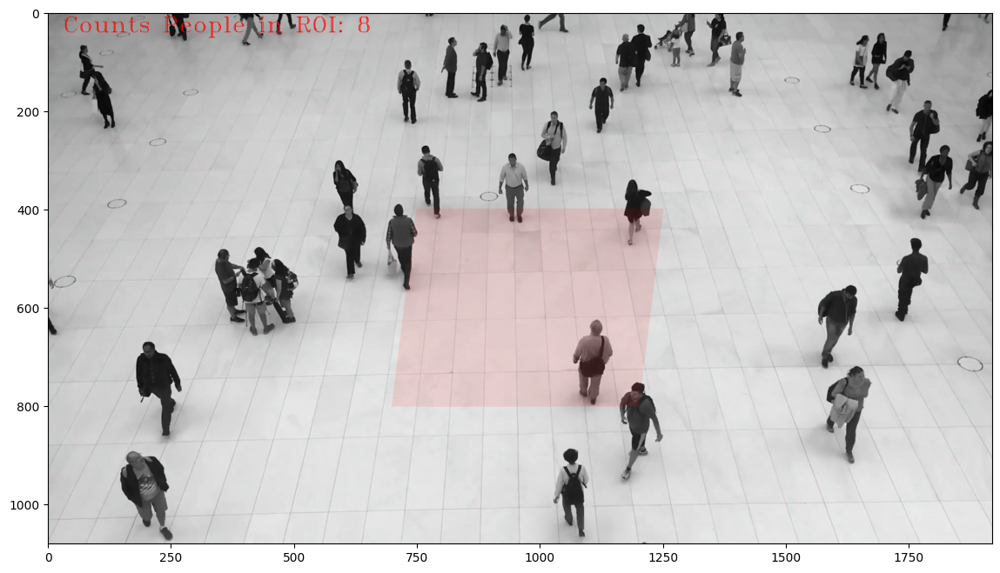

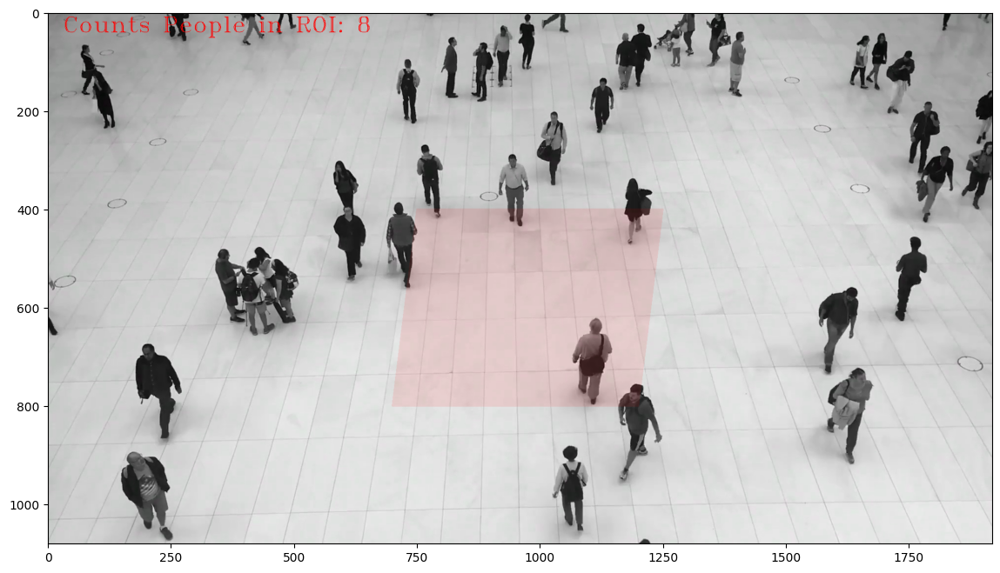

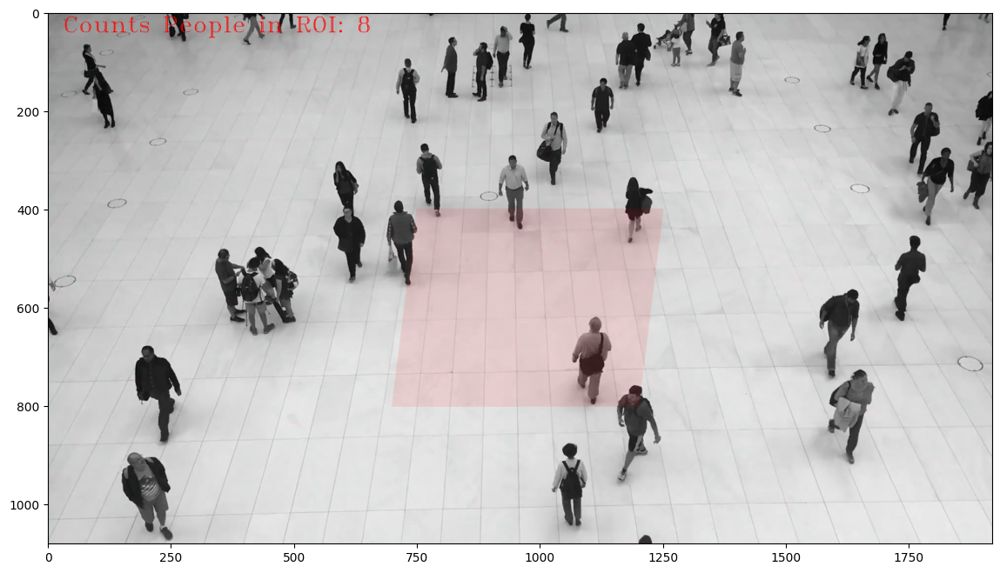

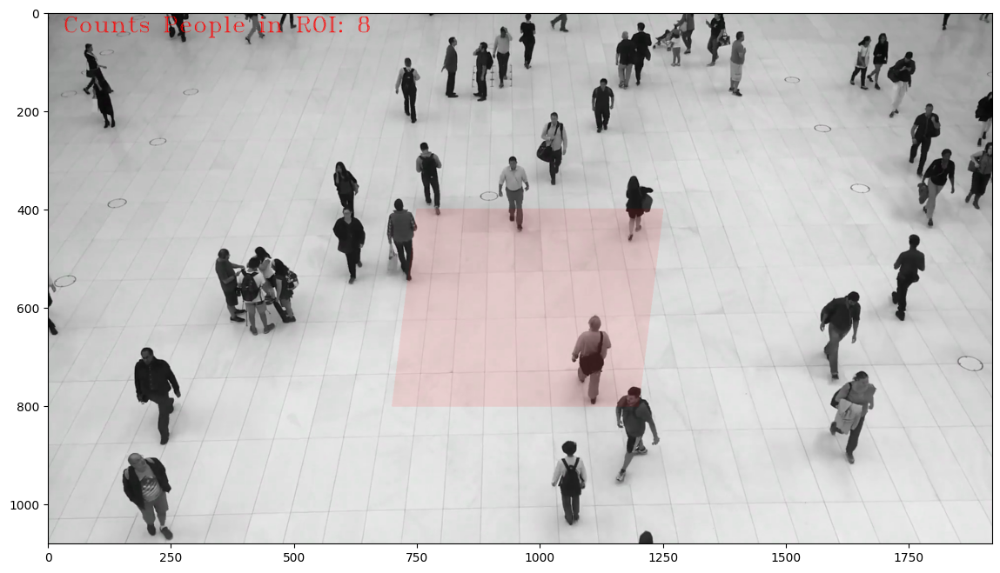

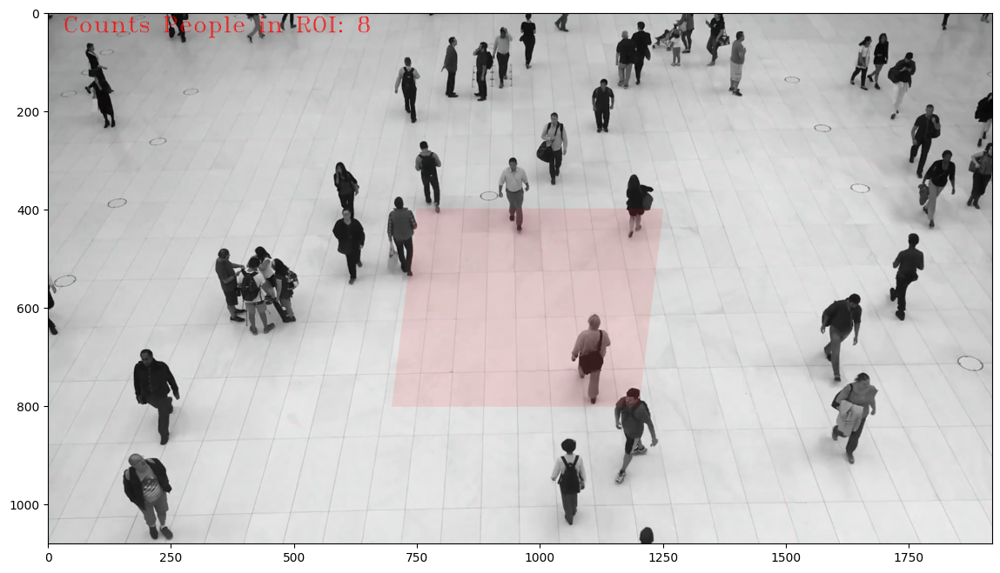

In [18]:
for i in [62,63, 64, 65, 66]:
    plt.figure(figsize =( 14, 10))
    plt.imshow(frames_list[i])
    plt.show()

In [19]:
#output video result
frac = 0.7
Video(data='rep_result.mp4', embed=True, height=int(720 * frac), width=int(1280 * frac))